# Zomato Data Analysis Presentation
### - By Nidhi Mishra

## **1.** **Data Cleaning and Wrangling**

In [1]:
# !pip install -q plotly==4.9.0
# !pip install -U -q PyDrive

In [2]:
import pandas as pd
# import pandas.testing as pt
import numpy as np
import re
import random
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
from plotly.offline import iplot
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
from scipy.stats import ttest_ind
%matplotlib inline

In [3]:
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

In [4]:
# link = 'https://drive.google.com/file/d/1lr3kXNU55DNZtoBsT_dTXxTdvFAa9bZF/view?usp=sharing'

In [5]:
# fluff , id = link.split('file/d/')
# f , id = id.split('/')
# print(f) # Verify that you have everything between 'file/d/ and /view'

In [6]:
# downloaded = drive.CreateFile({'id':f}) 
# downloaded.GetContentFile('zomato.csv')
# zomato = pd.read_csv('zomato.csv')

In [7]:
zomato = pd.read_csv('zomato.csv')

#### Lets take a look at our data:

In [8]:
zomato.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
url                            51717 non-null object
address                        51717 non-null object
name                           51717 non-null object
online_order                   51717 non-null object
book_table                     51717 non-null object
rate                           43942 non-null object
votes                          51717 non-null int64
phone                          50509 non-null object
location                       51696 non-null object
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null object
reviews_list                   51717 non-null object
menu_item                      51717 non-null object
listed_in(type)                51717 non-null object
listed_in(city)                51717 non-nul

In [9]:
zomato.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [10]:
# from google.colab import drive
# drive.mount('/content/drive')

#### After a quick look at the columns of the dataframe, I have decided to remove some columns which will not be very useful in the Data Analysis process like url, address, phone, menu_item and location as they are redundant.

In [11]:
zomato = zomato.iloc[:,np.r_[2:7,9:14,15:17]]

**After slicing off the unwanted columns, below is the final list of columns:**

In [12]:
# zomato.columns
set(zomato)

{'approx_cost(for two people)',
 'book_table',
 'cuisines',
 'dish_liked',
 'listed_in(city)',
 'listed_in(type)',
 'name',
 'online_order',
 'rate',
 'rest_type',
 'reviews_list',
 'votes'}

#### Now lets extract just the ratings of the restaurants from the reviews_list column which will be used later to fill in the missing values in rate column:


In [13]:
avg = []
for i in range(len(zomato)):
    l = list(map(int, re.findall(r'%s(\d+)' % 'Rated ',zomato['reviews_list'][i])))
    if len(l) >0:
        avg.append(round(sum(l)/len(l), 2))
    else:
        avg.append(0)   

In [14]:
zomato['review_rates'] = pd.Series(avg)

#### Now lets make the rate column more appropriate for Analysis by converting it to float type and removing '/5' from the rating"

In [15]:
rate = []
for index, data in enumerate(zomato.rate):
    if (data is not np.nan) & (data != 'NEW') & (data != '-'):
        rate.append(float(data.split('/')[0]))
    else:
        rate.append(data)

In [16]:
zomato['rate'] = pd.Series(rate)

#### Also Renaming our column names to more appropriate names: 

In [17]:
zomato.rename(columns={'cuisines' : 'Cuisine', 'listed_in(city)': 'Locality', 'listed_in(type)' : 'Listed_Type', 'approx_cost(for two people)': 'Approx_Cost', 'name': 'Name', 'rest_type':'Restaurant_Type', 'rate' : 'Rating', 'votes' : 'Total_Votes', 'online_order': 'Online_Order','book_table':'Table_Booking', 'dish_liked' : 'Dishes_Liked' }, inplace = True)
zomato.columns

Index(['Name', 'Online_Order', 'Table_Booking', 'Rating', 'Total_Votes',
       'Restaurant_Type', 'Dishes_Liked', 'Cuisine', 'Approx_Cost',
       'reviews_list', 'Listed_Type', 'Locality', 'review_rates'],
      dtype='object')

#### Dropping all Nans, Nulls and non-numeric characters from the dataset:

In [18]:
# Lets drop the data points with na and 0 rates:
zomato.drop(zomato[(zomato['review_rates'] == 0) & (zomato['Rating'].isna())].index, inplace=True)
# Replacing NaNs and '-' of rate with review rate values:
zomato['Rating'] = np.where(zomato.Rating.isna(), zomato.review_rates, zomato.Rating)
zomato['Rating'] = np.where(zomato['Rating'] == '-', zomato.review_rates, zomato.Rating)
#After dropping Nas 
zomato.head()

,Name,Online_Order,Table_Booking,Rating,Total_Votes,Restaurant_Type,Dishes_Liked,Cuisine,Approx_Cost,reviews_list,Listed_Type,Locality,review_rates
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,4.08
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,3.57
2,San Churro Cafe,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,3.15
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,3.51
4,Grand Village,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,4.00


In [19]:
# Lets save the newly opened restaurants in new DF before removing them:
zomato_New = zomato[zomato['Rating'] == 'NEW']
zomato.drop(zomato.Rating[zomato.Rating == 'NEW'].index, inplace=True)

In [20]:
# We have few columns with NaNs so lets drop these 
print("Approx_Cost column has {} Nan values and Cuisine column has {} Nan values, we need to drop these.".format(sum(zomato.Approx_Cost.isna()), sum(zomato.Cuisine.isna())))

Approx_Cost column has 300 Nan values and Cuisine column has 17 Nan values, we need to drop these.


In [21]:
zomato.dropna(subset=['Approx_Cost', 'Cuisine'], inplace = True)
#Dropping Reviews List and review_rates since we have used it to fill our Rating column and we dont need these:
zomato.drop(['reviews_list','review_rates'], axis =1, inplace=True)
zomato.head()

,Name,Online_Order,Table_Booking,Rating,Total_Votes,Restaurant_Type,Dishes_Liked,Cuisine,Approx_Cost,Listed_Type,Locality
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,Grand Village,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari


#### Now lets convert Rating, Approx_Cost to numeric data type and Remove the non- ascii characters from Name column.

In [22]:
# print(type(zomato['Approx_Cost'][0]))
zomato['Rating'] = zomato['Rating'].apply(pd.to_numeric)
zomato['Approx_Cost'].replace(',', '',regex=True, inplace=True)
zomato['Approx_Cost'] = zomato['Approx_Cost'].apply(pd.to_numeric)
zomato['Name'].replace({r'[^\x00-\x7F]+':''}, regex = True, inplace=True)
# type(zomato['Approx_Cost'][0])
zomato.head()

,Name,Online_Order,Table_Booking,Rating,Total_Votes,Restaurant_Type,Dishes_Liked,Cuisine,Approx_Cost,Listed_Type,Locality
0,Jalsa,Yes,Yes,4.1,775,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7,88,Quick Bites,Masala Dosa,"South Indian, North Indian",300,Buffet,Banashankari
4,Grand Village,No,No,3.8,166,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,Buffet,Banashankari


#### So now we can say that our DataFrame is clean and ready for Analysis. Lets take a quick look at our data info: 

In [23]:
zomato.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43922 entries, 0 to 51716
Data columns (total 11 columns):
Name               43922 non-null object
Online_Order       43922 non-null object
Table_Booking      43922 non-null object
Rating             43922 non-null float64
Total_Votes        43922 non-null int64
Restaurant_Type    43766 non-null object
Dishes_Liked       23353 non-null object
Cuisine            43922 non-null object
Approx_Cost        43922 non-null int64
Listed_Type        43922 non-null object
Locality           43922 non-null object
dtypes: float64(1), int64(2), object(8)
memory usage: 4.0+ MB


# **2.** **EDA - Visualization**

### Q) How many restaurants provide option of ordering online?

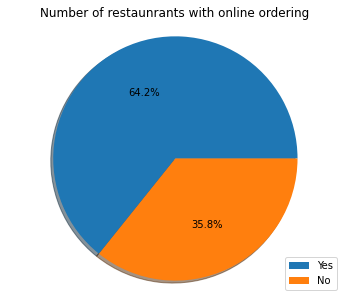

In [24]:
fig1, ax1 = plt.subplots(figsize=(6,5));
ax1.pie(zomato.Online_Order.value_counts().values, autopct = '%1.1f%%', shadow=True);
ax1.legend(zomato.Online_Order.value_counts().index,
          loc="lower right")
ax1.axis('equal');
ax1.set_title('Number of restaunrants with online ordering');

**We see that almost 65% of the restaurants have the online ordering facility, as it is one the major source of income**

In [25]:
# def func(pct, val):
#     abs1 = int(val/100*np.sum(val))
#     return '{.1f}%'.format(abs1)

# lambda pct: func(pct, zomato.online_order)
# ax = zomato.online_order.value_counts().plot.pie(y = zomato.online_order.value_counts().values,figsize=(10,5));

### Q) How many restaurants provide table booking, how are they different from the ones that dont?

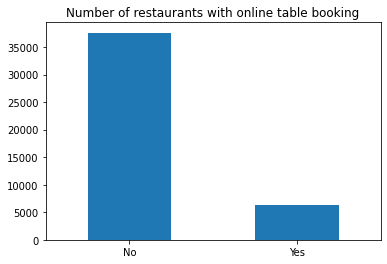

In [26]:
zomato.Table_Booking.value_counts().plot.bar();
plt.title('Number of restaurants with online table booking');
plt.xticks(rotation = 0);

**So here we see that most of the restaurants don't provide table booking option. They are very few, only around 5k out of almost 50k total so Lets look at the kind of restaurants these are.**

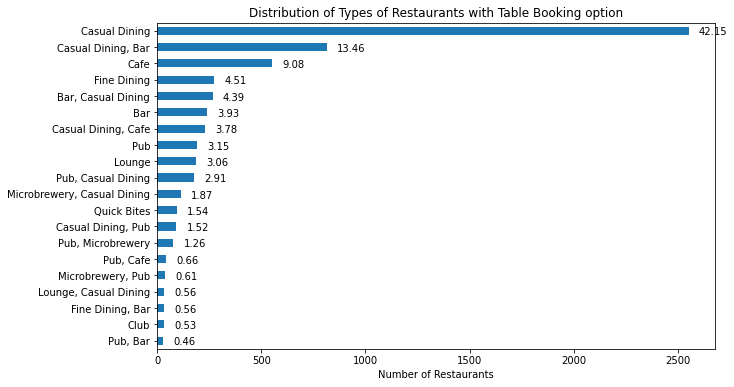

In [27]:
plt.figure(figsize=(10,6))
ax = zomato[zomato['Table_Booking'] == 'Yes'].Restaurant_Type.value_counts(ascending = True).tail(20).plot.barh(y = 'Restaurant_Type');
plt.xlabel('Number of Restaurants')
plt.title('Distribution of Types of Restaurants with Table Booking option');
ylab = zomato[zomato['Table_Booking'] == 'Yes'].Restaurant_Type.value_counts(ascending = True).tail(20).values
for i, v in enumerate(ylab):
  ax.text(v+50, i-0.25, np.around(v/sum(ylab)*100,2), color='black',  fontsize = 10)

**We can see from the graph that More than 55% of the restaurants with Table Booking option available are Casual Dining type and 9% are Cafes.**

**Lets check the average rating of Restaurants with and without Table Booking facility:**

In [28]:
print(zomato[zomato['Table_Booking'] == 'No'].Rating.describe())
print("The average rating of the restaurants without table booking option is 3.6 with 50% higher than 3.7/5. Also size of this dataset is larger. Is the cost also lower at such restaurants?")

count    37602.000000
mean         3.596383
std          0.561743
min          0.000000
25%          3.300000
50%          3.700000
75%          3.900000
max          5.000000
Name: Rating, dtype: float64
The average rating of the restaurants without table booking option is 3.6 with 50% higher than 3.7/5. Also size of this dataset is larger. Is the cost also lower at such restaurants?


In [29]:
print(zomato[zomato['Table_Booking'] == 'Yes'].Rating.describe())
print("There are 6k restaurants with table booking facility and have an average rating of 4.1 with 50% of them having more than 4.3/5 rating which shows that restaurants with table booking receive better rating. Is it truly the case?")

count    6320.000000
mean        4.142900
std         0.302807
min         2.200000
25%         4.000000
50%         4.200000
75%         4.300000
max         5.000000
Name: Rating, dtype: float64
There are 6k restaurants with table booking facility and have an average rating of 4.1 with 50% of them having more than 4.3/5 rating which shows that restaurants with table booking receive better rating. Is it truly the case?


In [30]:
print("The minimum cost at restaurants with table booking is Rs.{} while the minimum cost at restaurants without table booking is Rs.{}".format(zomato[zomato['Table_Booking'] == 'Yes'].Approx_Cost.min(), zomato[zomato['Table_Booking'] == 'No'].Approx_Cost.min()))

The minimum cost at restaurants with table booking is Rs.300 while the minimum cost at restaurants without table booking is Rs.40


### Hypothesis Testing (T-Test for comparing means of two groups.)

**Do Restaurants with Table Booking actually receive higher rating? Lets test this hypothesis.**

*H0 : The mean rating of restaurants with table booking facility is same as mean rating of restaurants without the facility of booking table.*<br>
*H1 : The mean rating of restaurants with table booking facility is geater than mean rating of restaurants without the facility of booking table.* <br>
> **H$_{0}$: $\mu_{1} == \mu_{2}$** <br>
> **H$_{1}$: $\mu_{1} > \mu_{2}$**

**Conditions for Hypothesis Testing:**
    - 1) Samples Are Random
    - 2) It is less than 10% of the population
    - 3) It can be considered normal as the size is larger than 30.

In [31]:
rand_Rate_Booking_No = pd.Series(random.sample(list(zomato[zomato['Table_Booking'] == 'No'].Rating), 40))
rand_Rate_Booking_Yes = pd.Series(random.sample(list(zomato[zomato['Table_Booking'] == 'Yes'].Rating), 30))

In [32]:
print('Statistics of a random sample of restaurants without table booking facility:')
rand_Rate_Booking_No.describe()

Statistics of a random sample of restaurants without table booking facility:


count    40.000000
mean      3.494000
std       0.557654
min       2.000000
25%       3.250000
50%       3.400000
75%       3.815000
max       5.000000
dtype: float64

In [33]:
print('Statistics of a random sample of restaurants with table booking facility:')
rand_Rate_Booking_Yes.describe()

Statistics of a random sample of restaurants with table booking facility:


count    30.000000
mean      4.146667
std       0.287358
min       3.700000
25%       3.925000
50%       4.150000
75%       4.375000
max       4.700000
dtype: float64

In [34]:
#Definitions of variables used in calculation of Test Statistic:
x1 = rand_Rate_Booking_Yes.mean()
x2 = rand_Rate_Booking_No.mean()
mu_1 = pd.Series(zomato[zomato['Table_Booking'] == 'Yes'].Rating).mean()
mu_2 = pd.Series(zomato[zomato['Table_Booking'] == 'No'].Rating).mean()
n1 = len(rand_Rate_Booking_Yes)
n2 = len(rand_Rate_Booking_No)
sd_1 = rand_Rate_Booking_Yes.std()
sd_2 = rand_Rate_Booking_No.std()
df = min((n1 - 1), (n2 - 1))

In [35]:
#However we will use the function to calculate out p - value:
t_stat, p = ttest_ind(rand_Rate_Booking_Yes,rand_Rate_Booking_No)
print('After running the T-test we get that:')
print('test statistic is', t_stat)
print('and p-Value is', p)

After running the T-test we get that:
test statistic is 5.847388040064944
and p-Value is 1.5681416219944706e-07


In [36]:
if (p < 0.05):
    print("Since P-value is lesser than significance level of 0.05, we reject the Null Hypothesis and Hence there is enough evidence that The mean rating of restaurants with table booking facility is geater than mean rating of restaurants without the facility of booking table. However we can not claim causal as there are other lurking variables.")
else:
    print("Since p-value is greater than significance level of 0.05, we fail to reject the Null Hypothesis and hence there is enough evidence that the mean rating of table booking retaurants is same as mean rating of restaurants without the facility of booking table.")

Since P-value is lesser than significance level of 0.05, we reject the Null Hypothesis and Hence there is enough evidence that The mean rating of restaurants with table booking facility is geater than mean rating of restaurants without the facility of booking table. However we can not claim causal as there are other lurking variables.


#### Lets now take a final look at the rate distributions of restaurants with and without table booking:

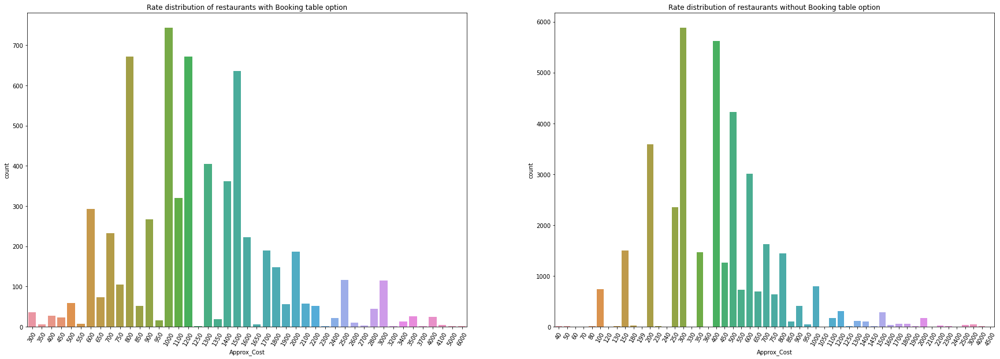

In [64]:
plt.figure(figsize=(30,10))
plt.subplot(1,2,1)
sns.countplot(zomato[zomato['Table_Booking'] == 'Yes']['Approx_Cost'])
plt.xticks(rotation = 60)
plt.title('Rate distribution of restaurants with Booking table option');
plt.subplot(1,2,2)
# plt.figure(figsize=(20,5))
sns.countplot(zomato[zomato['Table_Booking'] == 'No']['Approx_Cost'])
plt.xticks(rotation = 60)
plt.title('Rate distribution of restaurants without Booking table option');

**After analyzing further we see that restaurants with Table booking option have higher rating on average (From the Hypothesis) and are costlier than restaurants without booking table option. It start at 300 minimum where as the other type starts at Rs. 40. <br>
From the above graph we see that there are fewer and fewer restaurants with rates above Rs.3000. Lets see what kind of restaurants these are?**

### Q) What are kind of Restaurants with higher meal cost?

In [38]:
print(zomato[zomato['Approx_Cost'] > 3000]['Restaurant_Type'].value_counts())
print('Restaurants with cost higher than 3000 are under Fine Dining. Average cost the restaunrant with Fine Dining is', zomato[zomato['Approx_Cost'] > 3000].Approx_Cost.mean())

Fine Dining         56
Fine Dining, Bar    21
Lounge               2
Name: Restaurant_Type, dtype: int64
Restaurants with cost higher than 3000 are under Fine Dining. Average cost the restaunrant with Fine Dining is 3800.0


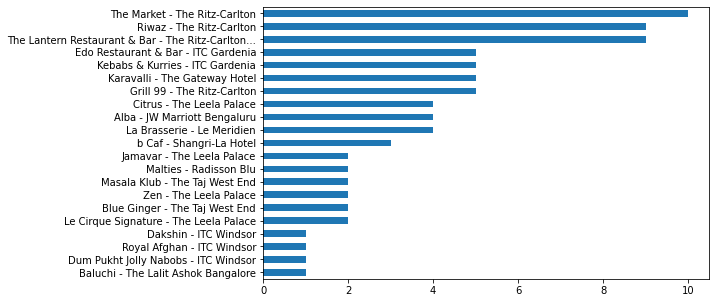

In [39]:
plt.figure(figsize=(8,5))
zomato[zomato['Approx_Cost'] > 3000]['Name'].value_counts(ascending=True).plot.barh();

**From the above analysis and graph, as expected we see that Fine Dining Restaurants are the costliest type and the most popular chain around bangaluru are Ritz Carlton, JW Marriot, Leela Palace and ITC.**

### Q) What are the most popular restaurants type around bangalore?

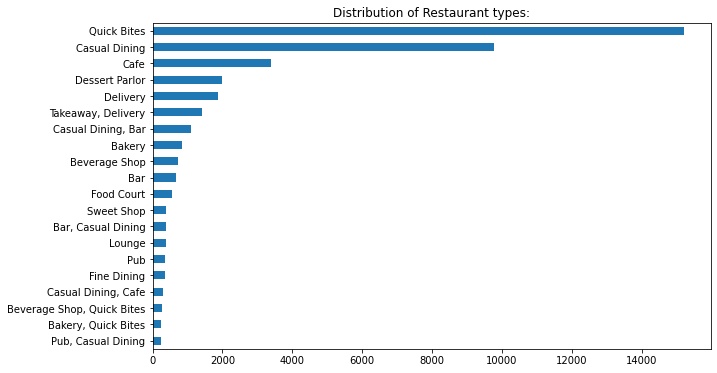

In [65]:
plt.figure(figsize=(10, 6))
zomato.Restaurant_Type.value_counts(ascending=True).tail(20).plot.barh();
plt.title('Distribution of Restaurant types:');

**From the graph above we see that Quick Bites is the dominating restaurant type in the market, followed by Casual Dining and  Cafes. Lets further analyze Quick Bites to find the leading restaurant/ chains.**

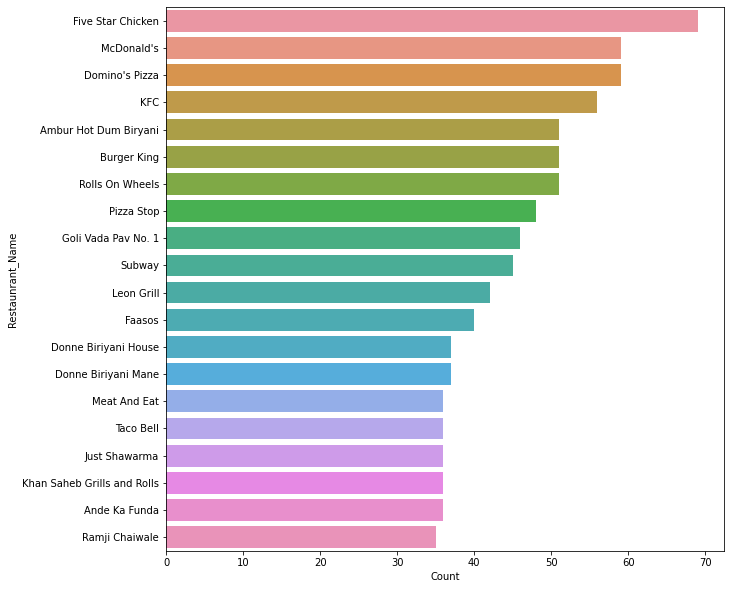

In [41]:
z1 = zomato[zomato['Restaurant_Type'] == 'Quick Bites']['Name'].value_counts().head(20).reset_index().rename(columns = {'index': 'Restaunrant_Name', 'Name':'Count'})
plt.figure(figsize=(10,10))
sns.barplot(y= 'Restaunrant_Name', x = 'Count', data = z1);

**Suprisingly 5-Star chicken, a local brand has over taken McDonalds, KFC and Dominos Pizza around bangalore.**

### Q) What are the various restaurants types with respect to the type of services they provide?

In [42]:
trace = go.Bar(x = zomato.Listed_Type.value_counts().keys(),
              y = zomato.Listed_Type.value_counts(),
              text = zomato.Listed_Type)
data = [trace]
layout = go.Layout(title = 'Distribution of Restaurants by Service Type', yaxis = dict(title = 'Number of Restaurants'))
fig = go.Figure(data = data, layout= layout)
py.iplot(fig);

**Delivery is most popular and adopted by most of the restaurants!**

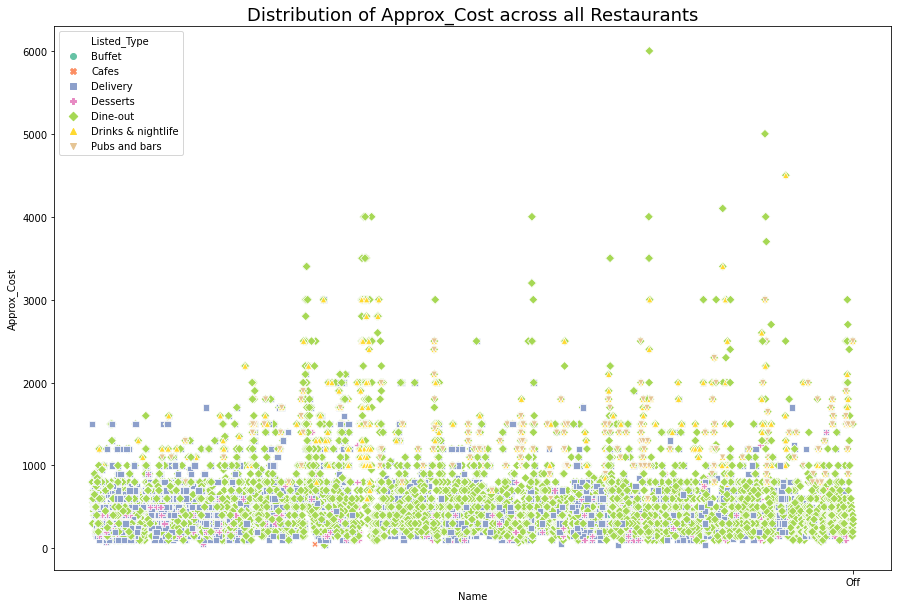

In [43]:
plt.figure(figsize = (15,10));
# cmap = sns.cubehelix_palette(dark=.3, light=.8, as_cmap=True)
sns.scatterplot(x='Name', y='Approx_Cost', s=40, data = zomato, hue = 'Listed_Type', style = 'Listed_Type', palette='Set2');
plt.xticks('Off')
plt.title('Distribution of Approx_Cost across all Restaurants', size= 18);

**Dine-out is more spread out from low cost to high cost meals restaurants.**

In [44]:
z = zomato['Dishes_Liked'].dropna()

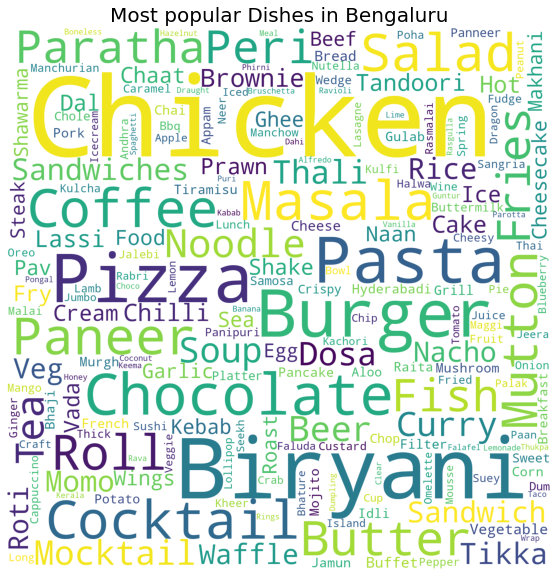

In [45]:
c1 = ' '.join([text for text in z])
plt.figure(figsize=(10,10))
wordcloud = WordCloud(background_color = 'white', collocations = False, width=1500, height=1500).generate(c1)
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most popular Dishes in Bengaluru', size = 20)
plt.show()

**We can see that the most popular dishes are Chicken, Biryani followed by Burger and Pizza.**

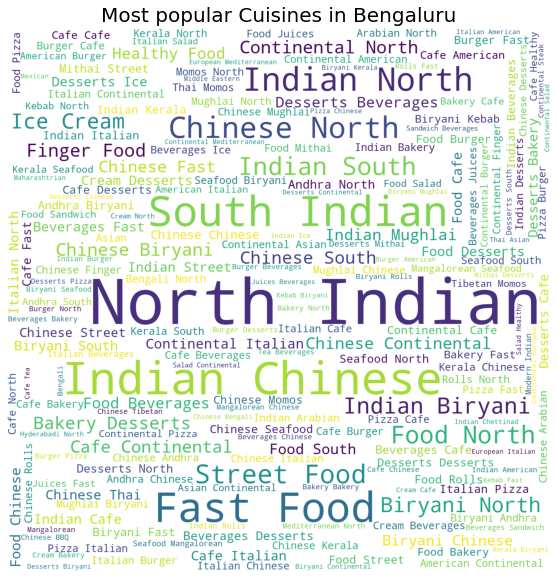

In [46]:
c2 = ' '.join([st for st in zomato['Cuisine']])
plt.figure(figsize=(10,10))
wordcloud = WordCloud(background_color = 'white', collocations = True, width=1500, height=1500).generate(c2)
plt.imshow(wordcloud)
plt.axis('off')
plt.title('Most popular Cuisines in Bengaluru', size = 20)
plt.show()

### Q) What are the most popular places for restaurants in bangalore?

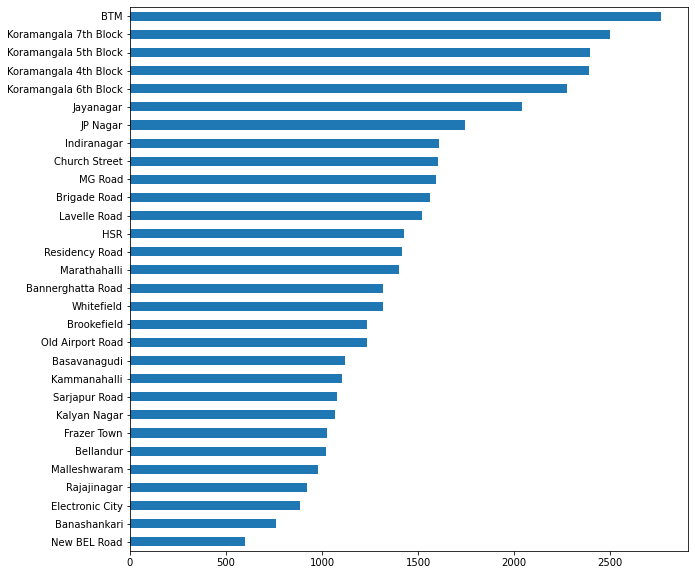

In [47]:
plt.figure(figsize=(10,10))
zomato.Locality.value_counts(ascending=True).plot.barh();

**Here we see that the locality with maximum restaurants is BTM with almost 3000 restaurants and Koramangala and least is New BEL Road.**

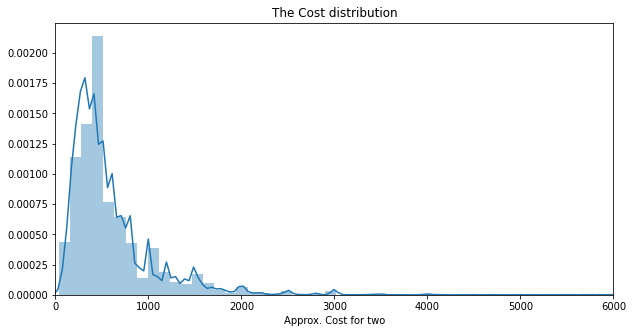

In [48]:
plt.figure(figsize=(10,5))
# zomato.Approx_Cost.plot.hist()
sns.distplot(zomato.Approx_Cost)
# plt.xticks(np.arange(0, 4500, 500))
plt.xlim(0, 6000)
plt.xlabel('Approx. Cost for two')
plt.title("The Cost distribution");

**We notice that the plot is right skewed with maximum cost being in range 0 to 1000 and very few going beyong 2000. What I would like to investigate further is what kind of restaurants cost higher than 2000 and how is their rating compared to other restaurants.**

**Lets check the distribution of rating of the restaurants.**

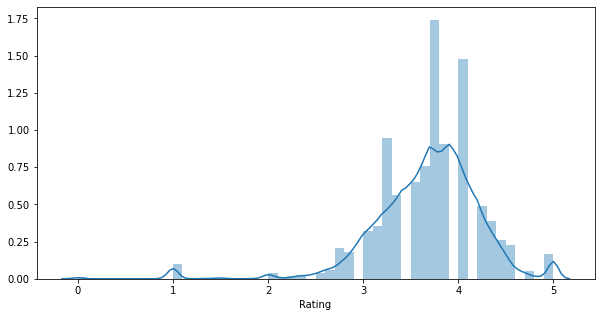

In [49]:
plt.figure(figsize=(10,5))
# zomato.Rating.plot.hist();
sns.distplot(zomato.Rating);

**Rating plot is left skewed with most of ratings between 3 to 4.5 and maximum at 4. Lets investigate further to see what kind of restaurants receive lower ratings and which restaurants have ratings higher than average.**

**Lets take a look at the restaurants with maximum number of branches in the city and are most popular.**

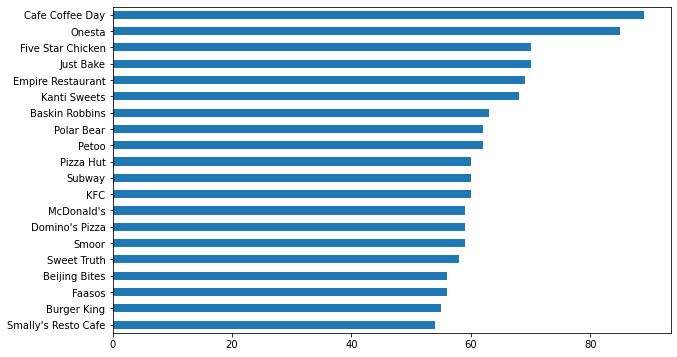

In [50]:
plt.figure(figsize=(10,6));
zomato.Name.value_counts(ascending = True).tail(20).plot.barh();

**CCD seems to have the largest number of chains in Bengaluru, followed by Onesta, Just Bake and Empire. Lets see what factors contribute to its success and popularity. Does CCD , Onesta have comparatively higher rating or cheaper cost?**

### Plot for Votes V/S Rate:

In [51]:
trace = go.Scatter(x = zomato['Rating'], y = zomato['Total_Votes'], textposition = 'top center', text = zomato['Name'], mode = 'markers')
data1 = [trace]
layout = go.Layout(title = 'Votes v/s Rating', xaxis = dict(title = 'Average Rate'), yaxis = dict(title = 'Total no. of Votes'))
fig = go.Figure(data = data1, layout = layout)
py.iplot(fig);

We see that there is a positive correlation between no of votes and the rating. As the number of votes are increasing the rating of the restaunrant also is going up. Maximum reataunrants have received a rating between 4 and 5. **Byg Brewski, Truffles and Absolute Barbeque have received the maximum votes and the highest rating among all the restaurants.**

In [52]:
# trace2 = go.Scatter(x = x, y = y, text = top_brands, mode = 'markers')
# data2 = [trace2]
# layout = go.Layout(title = 'Rating of top branches in the city', xaxis = dict(title = 'Rating'), yaxis = dict(title = 'No. of branches'))
# figure = go.Figure(data = data2, layout = layout)
# py.iplot(figure);

**Lets see the relationship between Rating and Cost of meal at a restaurant**

In [68]:
trace = go.Scatter(x = zomato['Rating'], y = zomato['Approx_Cost'], mode = 'markers', text = zomato['Name'])
data = [trace]
layout = go.Layout(title = 'Rating v/s Cost of meal at the restaurant', xaxis = dict(title = 'Rate'), yaxis = dict(title = 'Approx_Cost'))
fig = go.Figure(data = data, layout = layout)
py.iplot(fig);

**Are Cost of Restaurants in a particular Locatility costlier than other?**

In [54]:
zly = zomato.groupby(['Locality'])['Approx_Cost'].agg(np.mean)
zly = pd.DataFrame(zly)
zly.reset_index(inplace=True)

In [55]:
zly.sort_values(['Approx_Cost'], ascending = False, inplace=True)

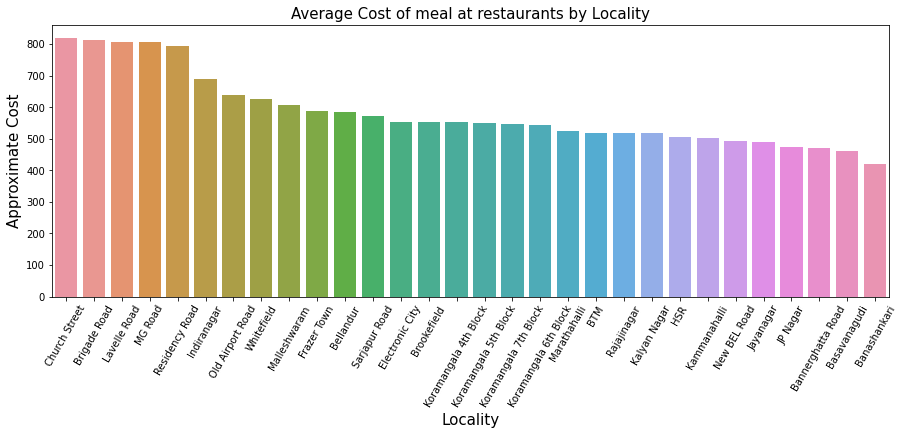

In [56]:
plt.figure(figsize=(15,5))
sns.barplot(x = 'Locality', y = 'Approx_Cost', data = zly);
plt.xticks(rotation = 60);
plt.xlabel('Locality', size = 15)
plt.ylabel('Approximate Cost', size = 15)
plt.title('Average Cost of meal at restaurants by Locality', size = 15);

**Here we see that Church Street, Brigade Road, Lavelle Road are among the costiest places for a meal and Banashankari has the cheapest meals.**

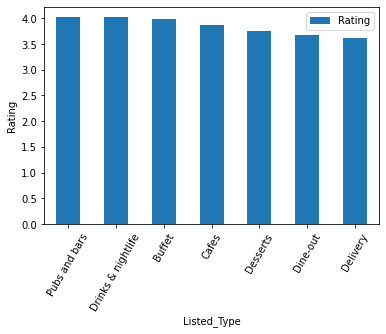

In [57]:
zomato.groupby(['Listed_Type'])['Rating'].agg(np.mean).reset_index(). set_index('Listed_Type').sort_values(['Rating'], ascending = False).plot.bar();
plt.xticks(rotation = 60);
plt.ylabel('Rating');

**Pubs and bars and drinks are highest rated category of restaurants.**

In [58]:
set(zomato)

{'Approx_Cost',
 'Cuisine',
 'Dishes_Liked',
 'Listed_Type',
 'Locality',
 'Name',
 'Online_Order',
 'Rating',
 'Restaurant_Type',
 'Table_Booking',
 'Total_Votes'}

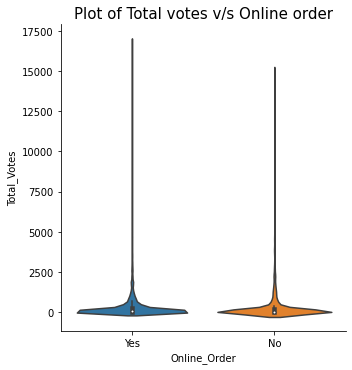

In [66]:
sns.catplot(x = 'Online_Order', y = 'Total_Votes', kind="violin", data = zomato)
plt.title("Plot of Total votes v/s Online order", size = 15) ;

**Now lets take a look at the ratings of the restaurants with maximum number of branches in the city and see of there is any relation:**

In [60]:
top_brands = zomato.Name.value_counts().head(7000).index
x = []
y = []
for tb in top_brands:
    x.append(zomato[zomato.Name == tb]['Rating'].mean())
    y.append(len(zomato[zomato.Name == tb]))

top_brands = pd.DataFrame(list(zip(x,y)))
top_brands.rename(columns = {0:'Avg_Rating', 1:'#OfBranches'}, inplace=True)

In [61]:
fig = px.scatter(top_brands, x="Avg_Rating", y="#OfBranches", trendline="ols")
fig.show()

**Seems like there is a relation between rating and number of branches opened for each brand.**

### THE END!